# Reinforcement Learning - Policy Gradient

<img src="https://raw.githubusercontent.com/jeremiedecock/polytechnique-inf581-2023/master/logo.jpg" style="float: left; width: 15%" />

[INF581-2023](https://moodle.polytechnique.fr/course/view.php?id=14259) Lab session #6

2019-2023 Jérémie Decock, Mohamed Alami

[![Open in Google Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/jeremiedecock/polytechnique-inf581-2023/blob/master/lab6_rl3_reinforce_answers.ipynb)

[![My Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/jeremiedecock/polytechnique-inf581-2023/master?filepath=lab6_rl3_reinforce_answers.ipynb)

[![NbViewer](https://raw.githubusercontent.com/jupyter/design/master/logos/Badges/nbviewer_badge.svg)](https://nbviewer.jupyter.org/github/jeremiedecock/polytechnique-inf581-2023/blob/master/lab6_rl3_reinforce_answers.ipynb)

[![Local](https://img.shields.io/badge/Local-Save%20As...-blue)](https://github.com/jeremiedecock/polytechnique-inf581-2023/raw/master/lab6_rl3_reinforce_answers.ipynb)

## Setup the Python environment

**Notice**: this notebook requires the following libraries: *PyTorch*, *Gymnasium*, NumPy, Pandas, Seaborn, imageio, pygame, ipywidgets, ipython and tqdm.

You can install them with the following command (the next cells do this for you if you use the Google Colab environment):

```
pip install gymnasium, imageio, ipython, ipywidgets, nnfigs, numpy, pandas, pygame, seaborn, torch, tqdm
```

In [ ]:
%matplotlib inline

import subprocess

try:
    from inf581 import *
except ModuleNotFoundError:
    process = subprocess.Popen("pip install nnfigs inf581".split(), stdout=subprocess.PIPE)
    for line in process.stdout:
        print(line.decode().strip())
    from inf581 import *

from inf581.lab7 import *

import matplotlib.pyplot as plt
import gymnasium as gym
import numpy as np
import seaborn as sns

from IPython.display import Image   # To display GIF images in the notebook

$
\newcommand{\vs}[1]{\mathbf{#1}} % vector symbol (\boldsymbol, \textbf or \vec)
\newcommand{\ms}[1]{\mathbf{#1}} % matrix symbol (\boldsymbol, \textbf)
\def\U{V}
\def\action{\vs{a}}       % action
\def\A{\mathcal{A}}        % TODO
\def\actionset{\mathcal{A}} %%%
\def\discount{\gamma}  % discount factor
\def\state{\vs{s}}         % state
\def\S{\mathcal{S}}         % TODO
\def\stateset{\mathcal{S}}  %%%
%
\def\E{\mathbb{E}}
%\newcommand{transition}{T(s,a,s')}
%\newcommand{transitionfunc}{\mathcal{T}^a_{ss'}}
\newcommand{transitionfunc}{P}
\newcommand{transitionfuncinst}{P(\nextstate|\state,\action)}
\newcommand{transitionfuncpi}{\mathcal{T}^{\pi_i(s)}_{ss'}}
\newcommand{rewardfunc}{r}
\newcommand{rewardfuncinst}{r(\state,\action,\nextstate)}
\newcommand{rewardfuncpi}{r(s,\pi_i(s),s')}
\newcommand{statespace}{\mathcal{S}}
\newcommand{statespaceterm}{\mathcal{S}^F}
\newcommand{statespacefull}{\mathcal{S^+}}
\newcommand{actionspace}{\mathcal{A}}
\newcommand{reward}{R}
\newcommand{statet}{S}
\newcommand{actiont}{A}
\newcommand{newstatet}{S'}
\newcommand{nextstate}{\state'}
\newcommand{newactiont}{A'}
\newcommand{stepsize}{\alpha}
\newcommand{discount}{\gamma}
\newcommand{qtable}{Q}
\newcommand{finalstate}{\state_F}
%
\newcommand{\vs}[1]{\boldsymbol{#1}} % vector symbol (\boldsymbol, \textbf or \vec)
\newcommand{\ms}[1]{\boldsymbol{#1}} % matrix symbol (\boldsymbol, \textbf)
\def\vit{Value Iteration}
\def\pit{Policy Iteration}
\def\discount{\gamma}  % discount factor
\def\state{\vs{s}}         % state
\def\S{\mathcal{S}}         % TODO
\def\stateset{\mathcal{S}}  %%%
\def\cstateset{\mathcal{X}} %%%
\def\x{\vs{x}}                    % TODO cstate
\def\cstate{\vs{x}}               %%%
\def\policy{\pi}
\def\piparam{\vs{\theta}}         % TODO pparam
\def\action{\vs{a}}       % action
\def\A{\mathcal{A}}        % TODO
\def\actionset{\mathcal{A}} %%%
\def\caction{\vs{u}}       % action
\def\cactionset{\mathcal{U}} %%%
\def\decision{\vs{d}}       % decision
\def\randvar{\vs{\omega}}       %%%
\def\randset{\Omega}       %%%
\def\transition{T}       %%%
\def\immediatereward{r}    %%%
\def\strategichorizon{s}    %%% % TODO
\def\tacticalhorizon{k}    %%%  % TODO
\def\operationalhorizon{h}    %%%
\def\constalpha{a}    %%%
\def\U{V}              % utility function
\def\valuefunc{V}
\def\X{\mathcal{X}}
\def\meu{Maximum Expected Utility}
\def\finaltime{T}
\def\timeindex{t}
\def\iterationindex{i}
\def\decisionfunc{d}       % action
\def\mdp{\text{MDP}}
$

## Introduction

In a previous lab, we have dealt with reinforcement learning in discrete state and action spaces.
To do so, we used methods based on action-value function and, especially, $Q$-function estimation.
The $Q$-function was stored in a table and updated with on- or off- policy algorithms (namely SARSA and $Q$-Learning). 

Yet, these methods do not scale to large state spaces and especially not to the case of continuous state spaces.
To address these issues one can either extend value-based methods making use of value-function approximation or directly search in policy spaces.
In this lab, we will explore both solutions. 

The first part of this lab presents the problem to solve: the CartPole envronment. 

In the second part, we will search in a family of parameterized policies $\pi_\theta(s, a)$ using a policy gradient method.

In the third part of this lab, we will apply value-function approximation methods (namely DQN) to solve the CartPole problem.

# Part 1: Hands on Cart Pole environment

For the purpose of focusing on the algorithms, we will use standard environments provided by the Gymnasium suite.
Gymnasium provides controllable environments (https://gymnasium.farama.org/environments/classic_control/) for research in reinforcement learning.
Especially, we will try to solve the CartPole-v1 environment (c.f. https://gymnasium.farama.org/environments/classic_control/cart_pole/) which offers a continuous state space and discrete action space.
The Cart Pole task consists in maintaining a pole in a vertical position by moving a cart on which the pole is attached with a joint.
No friction is considered.
The task is supposed to be solved if the pole stays up-right (within 15 degrees) for 195 steps in average over 100 episodes while keeping the cart position within reasonable bounds.
The state is given by $\{x,\frac{\partial x}{\partial t},\omega,\frac{\partial \omega}{\partial t}\}$ where $x$ is the position of the cart and $\omega$ is the angle between the pole and vertical position.
There are only two possible actions: $a \in \{0, 1\}$ where $a = 0$ means "push the cart to the LEFT" and $a = 1$ means "push the cart to the RIGHT".

## Exercise 1: Hands on Cart Pole

**Task 1:** read https://gymnasium.farama.org/environments/classic_control/cart_pole/ to discover the CartPole environment.

**Notice:** A reminder of Gymnasium main concepts is available at https://gymnasium.farama.org/content/basic_usage/.

Print some information about the environment:

In [2]:
env = gym.make('CartPole-v1')
print("State space dimension is:", env.observation_space.shape[0])
print("State upper bounds:", env.observation_space.high)
print("State lower bounds:", env.observation_space.low)
print("Actions are: {" + ", ".join([str(a) for a in range(env.action_space.n)]) + "}")
env.close()

State space dimension is: 4
State upper bounds: [4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38]
State lower bounds: [-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38]
Actions are: {0, 1}


**Task 2:** Run the following cells and check different basic 

policies (for instance constant actions or randomly drawn actions) to discover the CartPole environment.
Although this environment has easy dynamics that can be computed analytically, we will solve this problem with Policy Gradient based Reinforcement learning.

### Test the CartPole environment with a constant policy

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

[ 0.02716496  0.03657495 -0.01119541  0.01910706]
[ 0.02789646 -0.15838467 -0.01081327  0.30823679]
[ 0.02472877 -0.35335089 -0.00464853  0.59748998]
[ 0.01766175 -0.54840749  0.00730126  0.88870505]
[ 0.0066936  -0.74362776  0.02507537  1.1836742 ]
[-0.00817896 -0.93906591  0.04874885  1.48411066]
[-0.02696027 -1.13474718  0.07843106  1.79161034]
[-0.04965522 -1.33065598  0.11426327  2.10760526]
[-0.07626834 -1.52672181  0.15641537  2.43330656]
[-0.10680277 -1.72280255  0.20508151  2.76963588]
xxxxxxxxxx

/home/jeremie/anaconda3/envs/psc/lib/python3.7/site-packages/gym/logger.py:30: UserWarning: WARN: You are calling 'step()' even though this environment has already returned done = True. You should always call 'reset()' once you receive 'done = True' -- any further steps are undefined behavior.
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx


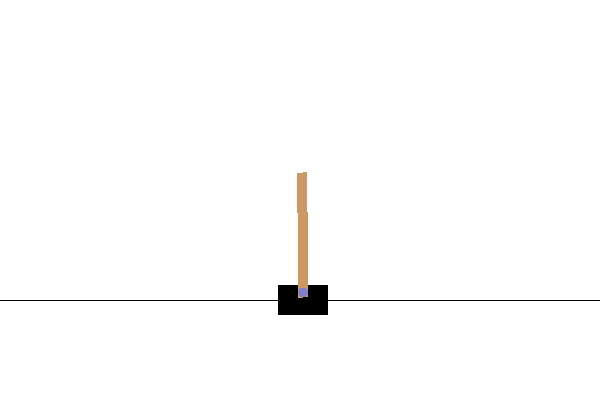

In [3]:
env = gym.make('CartPole-v1', render_mode='rgb_array')
RenderWrapper.register(env, force_gif=True)

observation, info = env.reset()
done = False

for t in range(50):
    env.render_wrapper.render()

    if not done:
        print(observation)
    else:
        print("x", end="")

    ### BEGIN SOLUTION ###

    action = 0
    observation, reward, done, truncated, info = env.step(action)

    ### END SOLUTION ###


print()
env.close()

env.render_wrapper.make_gif("rl3_ex1left")

[-0.03627086 -0.04825487  0.01573046 -0.01848333]
[-0.03723596  0.146638    0.01536079 -0.3061619 ]
[-0.0343032   0.34153773  0.00923755 -0.59396111]
[-0.02747244  0.53652917 -0.00264167 -0.88371999]
[-0.01674186  0.73168689 -0.02031607 -1.1772322 ]
[-0.00210812  0.92706676 -0.04386071 -1.47621403]
[ 0.01643321  1.12269619 -0.07338499 -1.78226688]
[ 0.03888714  1.31856256 -0.10903033 -2.09683151]
[ 0.06525839  1.5145992  -0.15096696 -2.42113184]
[ 0.09555037  1.71066891 -0.1993896  -2.75610718]
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx


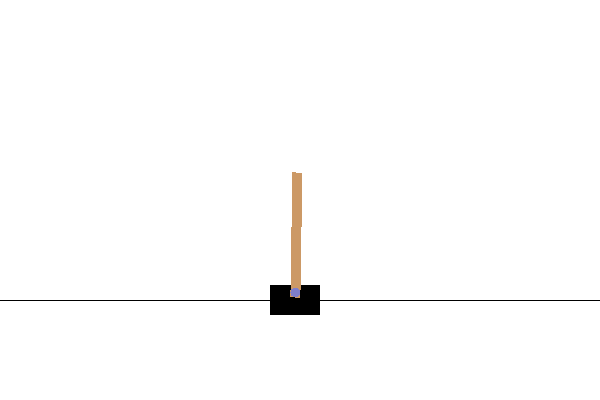

In [4]:
env = gym.make('CartPole-v1', render_mode='rgb_array')
RenderWrapper.register(env, force_gif=True)

observation, info = env.reset()
done = False

for t in range(50):
    env.render_wrapper.render()

    if not done:
        print(observation)
    else:
        print("x", end="")

    ### BEGIN SOLUTION ###

    action = 1
    observation, reward, done, truncated, info = env.step(action)

    ### END SOLUTION ###

print()
env.close()

env.render_wrapper.make_gif("rl3_ex1right")

### Test the CartPole environment with a random policy

[ 0.02273989 -0.01056946  0.00567579 -0.04691573]
[ 0.0225285  -0.20577233  0.00473748  0.24755254]
[ 0.01841305 -0.01071836  0.00968853 -0.04363232]
[ 0.01819869 -0.20597789  0.00881588  0.25209161]
[ 0.01407913 -0.40122461  0.01385771  0.54754215]
[ 0.00605464 -0.20630006  0.02480856  0.25925743]
[ 0.00192864 -0.40176723  0.02999371  0.55966093]
[-0.00610671 -0.20707882  0.04118692  0.27657649]
[-0.01024828 -0.40276344  0.04671845  0.58196002]
[-0.01830355 -0.59850776  0.05835765  0.88898636]
[-0.03027371 -0.79437102  0.07613738  1.19942854]
[-0.04616113 -0.60031217  0.10012595  0.93154633]
[-0.05816737 -0.79663234  0.11875688  1.25393957]
[-0.07410002 -0.60321448  0.14383567  1.00068875]
[-0.08616431 -0.79993513  0.16384945  1.33486458]
[-0.10216301 -0.99669845  0.19054674  1.67401308]
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
[0.0090905  0.03222883 0.03324542 0.01659244]
[ 0.00973508  0.22685862  0.03357727 -0.26541857]
[0.01427225 0.03127392 0.0282689  0.03766298]
[ 0

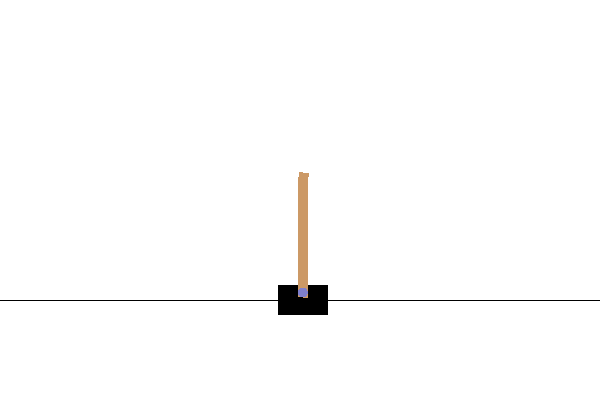

In [5]:
env = gym.make('CartPole-v1', render_mode='rgb_array')
RenderWrapper.register(env, force_gif=True)

for episode_index in range(5):
    observation, info = env.reset()
    done = False

    for t in range(70):
        env.render_wrapper.render()

        if not done:
            print(observation)
        else:
            print("x", end="")
        
        ### BEGIN SOLUTION ###

        action = env.action_space.sample()
        observation, reward, done, truncated, info = env.step(action)

        ### END SOLUTION ###

    print()
    env.close()

env.render_wrapper.make_gif("rl3_ex1random")

# Part 2: Implement REINFORCE

We will solve the CartPole environment using a policy gradient method which directly searchs in a family of parameterized policies $\pi_\theta(s, a)$ for the optimal policy.
This method performs gradient ascent in the policy space so that the total return is maximized.
We will restrict our work to episodic tasks, *i.e.* tasks that have a starting states and last for a finite and fixed number of steps $H$, called horizon. 

More formally, we define an optimization criterion that we want to maximize:

$$J(\theta) = \E_{\pi_\theta}\left[\sum_{t=1}^H r(s_t,a_t)\right],$$

where $\E_{\pi_\theta}$ means $a \sim \pi_\theta(s,.)$ and $H$ is the horizon of the episode.
In other words, we want to maximize the value of the starting state: $V^{\pi_\theta}(s)$.
The policy gradient theorem tells us that:

$$
\nabla_\theta J(\theta) = \nabla_\theta V^{\pi_\theta}(s) = \E_{\pi_\theta} \left[\nabla_\theta \log \pi_\theta (s,a) ~ Q^{\pi_\theta}(s,a) \right],
$$
With 

$$Q^\pi(s,a) = \E^\pi \left[\sum_{t=1}^H r(s_t,a_t)|s=s_1, a=a_1\right].$$

Policy Gradient theorem is extremely powerful because it says one doesn't need to know the dynamics of the system to compute the gradient if one can compute the $Q$-function of the current policy.
By applying the policy and observing the one-step transitions is enough.
Using a stochastic gradient ascent and replacing $Q^{\pi_\theta}(s_t,a_t)$ by a Monte Carlo estimate $R_t = \sum_{t'=t}^H r(s_{t'},a_{t'})$ over one single trajectory, we end up with a special case of the REINFORCE algorithm (see Algorithm below).

---
REINFORCE with Policy Gradient theorem Algorithm
---

Initialize $\theta^0$ as random<br>
Initialize step-size $\alpha_0$<br>
$n \leftarrow 0$<br>
<b>WHILE</b> no convergence<br>
	$\quad$ Generate rollout $h_n \leftarrow \{s_1^n,a_1^n,r_1^n, \ldots, s_H^n, a_H^n, r_H^n\} \sim \pi_{\theta^n}$<br>
	$\quad$ $PG_\theta \leftarrow 0$<br>
	$\quad$ <b>FOR</b> $t=1$ to $H$<br>
		$\quad\quad$ $R_t \leftarrow \sum_{t'=t}^H r_{t'}^n$<br>
		$\quad\quad$ $PG_\theta \leftarrow PG_\theta + \nabla_\theta \log \pi_{\theta^{n}}(s_t,a_t) ~ R_t$<br>
	$\quad$ $n \leftarrow n + 1$ <br>
	$\quad$ $\theta^n \leftarrow \theta^{n-1} + \alpha_n PG_\theta$<br>
	$\quad$  update $\alpha_n$ (if step-size scheduling)<br>

<b>RETURN</b> $\theta^n$ 

## Exercise 2: Implement a sigmoid policy

As the number of actions is $2$ (push the cart to the left or push it to the right), one can see the problem of controlling the Cart Pole as a binary classification problem.
Binary classification can be easily solved thanks to logistic regression which transforms the classification problem into a regression problem using the sigmoid function.

**Task 1**: Implement the `sigmoid` function defined by:

$$\sigma(x) = \frac{1}{1+e^{-x}}.$$

In [6]:
def sigmoid(x):
    ### BEGIN SOLUTION ###
    return 1.0 / (1.0 + np.exp(-x))
    ### END SOLUTION ###

**Task 2**: Complete the `logistic_regression` function that implements the logistic regression. This function returns the probability to draw action 1 ("push right") w.r.t the parameter vector $\theta$ and the input vector $s$ (the 4-dimension state vector).

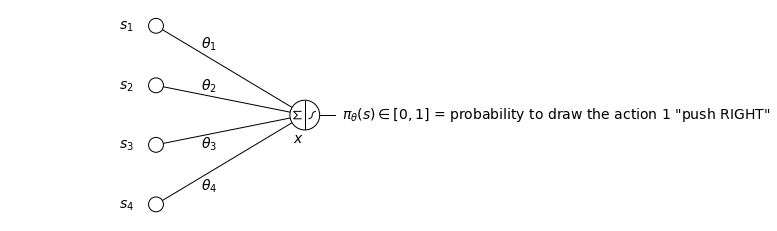

In [7]:
plot_logistic_regression_fig()

In [8]:
def logistic_regression(s, theta):
    ### BEGIN SOLUTION ###
    prob_push_right = sigmoid(np.dot(s, np.transpose(theta)))
    ### END SOLUTION ###

    return prob_push_right

**Task 3**: Complete the `draw_action` function that draw an action according to current policy i.e. that select the *RIGHT* action with probability $\sigma(\theta^\top s)$, where $\theta$ is the parameter vector and $s$ is the 4-dimension state vector.

In [9]:
def draw_action(s, theta):
    prob_push_right = logistic_regression(s, theta)

    ### BEGIN SOLUTION ###

    r = np.random.rand()
    if r < prob_push_right:
        return 1
    else:
        return 0

    ### END SOLUTION ###

## Exercise 3: Compute $\nabla_{\theta} \log \pi_\theta (s,a)$

Verify that, for a sigmoid policy:
- $\nabla_\theta \log \pi_\theta (s,\text{RIGHT}) = \pi_\theta (s, \text{LEFT}) \times s$
- $\nabla_\theta \log \pi_\theta (s,\text{LEFT}) = - \pi_\theta (s, \text{RIGHT}) \times s$ 

### Answer

First, let's define $\pi(s, RIGHT)$ and $\pi(s, LEFT)$:
- $\pi(s, RIGHT) = \sigma(s^\top \theta)$
- $\pi(s, LEFT) = 1 - \sigma(s^\top \theta)$

Then, let's compute the derivative of the sigmoid function:
$$
\sigma'(x) = \sigma(x) (1 - \sigma(x))
$$

1. Compute $\nabla_\theta \log \pi_\theta (s,\text{RIGHT})$:

\begin{align}
\nabla_\theta \log \pi_\theta (s,\text{RIGHT})
&= \nabla_\theta \log \sigma(s^\top \theta) \\
&= \frac{1}{\sigma(s^\top \theta)} \nabla_\theta \sigma(s^\top \theta) \\
&= \frac{1}{\sigma(s^\top \theta)} \sigma(s^\top \theta) (1 - \sigma(s^\top \theta)) ~ s \\
&= (1 - \sigma(s^\top \theta)) ~ s \\
&= \pi_\theta(s, \text{LEFT}) \times s \\
\end{align}

2. Compute $\nabla_\theta \log \pi_\theta (s,\text{LEFT})$:

\begin{align}
\nabla_\theta \log \pi_\theta (s,\text{LEFT})
&= \nabla_\theta \log (1 - \sigma(s^\top \theta)) \\
&= \frac{1}{1 - \sigma(s^\top \theta)} \nabla_\theta (1 - \sigma(s^\top \theta)) \\
&= \frac{-1}{1 - \sigma(s^\top \theta)} \sigma(s^\top \theta) (1 - \sigma(s^\top \theta)) ~ s \\
&= -\sigma(s^\top \theta) ~ s \\
&= -\pi_\theta(s, \text{RIGHT}) \times s \\
\end{align}

## Exercise 4: Implement REINFORCE

Fill the following cells to implement the REINFORCE algorithm (defined in the introduction of this notebook).

In [10]:
ENV_NAME = "CartPole-v1"

# Since the goal is to attain an average return of 195, horizon should be larger than 195 steps (say 300 for instance)
EPISODE_DURATION = 300

ALPHA_INIT = 0.1
SCORE = 195.0
NUM_EPISODES = 100
LEFT = 0
RIGHT = 1

VERBOSE = True

**Task 1**: Implement the `play_one_episode` function that plays an episode with the given policy $\pi_\theta$ (for fixed horizon $H$) and returns its rollouts.

In [11]:
# Generate an episode
def play_one_episode(env, theta, max_episode_length=EPISODE_DURATION, render=False):
    s_t, info = env.reset()

    episode_states = []
    episode_actions = []
    episode_rewards = []
    episode_states.append(s_t)

    for t in range(max_episode_length):

        if render:
            env.render_wrapper.render()

        ### BEGIN SOLUTION ###

        a_t = draw_action(s_t, theta)
        s_t, r_t, done, truncated, info = env.step(a_t)

        ### END SOLUTION ###

        episode_states.append(s_t)
        episode_actions.append(a_t)
        episode_rewards.append(r_t)

        if done:
            break

    return episode_states, episode_actions, episode_rewards

**Task 2**: Implement the `score_on_multiple_episodes` function that test the given policy $\pi_\theta$ on `num_episodes` episodes (for fixed horizon $H$) and returns:
- `success`: `True` if the agent got an average reward greater or equals to 195 over 100 consecutive trials, `False` otherwise
- `num_success`: the number of episodes where the agent got an average reward greater or equals to 195
- `average_return`: the average reward on the `num_episodes` episodes

In [12]:
def score_on_multiple_episodes(env, theta, score=SCORE, num_episodes=NUM_EPISODES, max_episode_length=EPISODE_DURATION, render=False):
    
    ### BEGIN SOLUTION ###
    
    num_success = 0
    average_return = 0
    num_consecutive_success = [0]

    for episode_index in range(num_episodes):
        _, _, episode_rewards = play_one_episode(env, theta, max_episode_length, render)

        total_rewards = sum(episode_rewards)

        if total_rewards >= score:
            num_success += 1
            num_consecutive_success[-1] += 1
        else:
            num_consecutive_success.append(0)

        average_return += (1.0 / num_episodes) * total_rewards

        if render:
            print("Test Episode {0}: Total Reward = {1} - Success = {2}".format(episode_index,total_rewards,total_rewards>score))

    if max(num_consecutive_success) >= 100:    # MAY BE ADAPTED TO SPEED UP THE LERNING PROCEDURE
        success = True
    else:
        success = False
        
    ### END SOLUTION ###

    return success, num_success, average_return

**Task 3**: Implement the `compute_policy_gradient` function that returns Policy Gradient for a given episode: policy gradient = $\sum_{t=1}^H \nabla_\theta \log \pi_\theta(s_t,a,_t) R_t$.

In [13]:
# Returns Policy Gradient for a given episode
def compute_policy_gradient(episode_states, episode_actions, episode_rewards, theta):

    ### BEGIN SOLUTION ###

    H = len(episode_rewards)
    PG = 0

    for t in range(H):

        prob_push_right = logistic_regression(episode_states[t], theta)
        a_t = episode_actions[t]
        R_t = sum(episode_rewards[t::])
        if a_t == LEFT:
            g_theta_log_pi = - prob_push_right * episode_states[t] * R_t
        else:
            prob_push_left = (1 - prob_push_right)
            g_theta_log_pi = prob_push_left * episode_states[t] * R_t

        PG += g_theta_log_pi

    ### END SOLUTION ###

    return PG

**Task 4**: Implement the `train` function that updates $\theta$ parameters with gradient ascent until the agent got an average reward greater or equals to 195 over 100 consecutive trials.

In [14]:
# Train the agent got an average reward greater or equals to 195 over 100 consecutive trials
def train(env, theta_init, max_episode_length = EPISODE_DURATION, alpha_init = ALPHA_INIT):

    theta = theta_init
    episode_index = 0
    average_returns = []

    success, _, R = score_on_multiple_episodes(env, theta)
    average_returns.append(R)

    # Train until success
    while (not success):

        ### BEGIN SOLUTION ###

        # Rollout
        episode_states, episode_actions, episode_rewards = play_one_episode(env, theta, max_episode_length)

        # Schedule step size
        #alpha = alpha_init
        alpha = alpha_init / (1 + episode_index)

        # Compute gradient
        PG = compute_policy_gradient(episode_states, episode_actions, episode_rewards, theta)

        # Do gradient ascent
        theta += alpha * PG

        # Test new policy
        success, _, R = score_on_multiple_episodes(env, theta, render=False)

        # Monitoring
        average_returns.append(R)

        episode_index += 1

        if VERBOSE:
            print("Episode {0}, average return: {1}".format(episode_index, R))

        ### END SOLUTION ###

    return theta, episode_index, average_returns

### Train the agent

In [15]:
#np.random.seed(1234)
env = gym.make(ENV_NAME, render_mode='rgb_array')
RenderWrapper.register(env, force_gif=True)
#env.seed(1234)

In [16]:
dim = env.observation_space.shape[0]

# Init parameters to random
theta_init = np.random.randn(1, dim)

# Train the agent
theta, i, average_returns = train(env, theta_init)

print("Solved after {} iterations".format(i))

Episode 1, average return: 64.54
Episode 2, average return: 33.39
Episode 3, average return: 76.35000000000001
Episode 4, average return: 123.93000000000002
Episode 5, average return: 119.94
Episode 6, average return: 87.44000000000003
Episode 7, average return: 77.71
Episode 8, average return: 53.05
Episode 9, average return: 50.64
Episode 10, average return: 43.64
Episode 11, average return: 46.079999999999984
Episode 12, average return: 59.330000000000005
Episode 13, average return: 49.229999999999976
Episode 14, average return: 48.65
Episode 15, average return: 42.43
Episode 16, average return: 51.68000000000001
Episode 17, average return: 46.929999999999986
Episode 18, average return: 55.210000000000015
Episode 19, average return: 51.43000000000001
Episode 20, average return: 57.48
Episode 21, average return: 49.80999999999999
Episode 22, average return: 51.480000000000004
Episode 23, average return: 50.949999999999974
Episode 24, average return: 53.879999999999995
Episode 25, ave

### Test final policy

Test Episode 0: Total Reward = 200.0 - Success = True
Test Episode 1: Total Reward = 200.0 - Success = True
Test Episode 2: Total Reward = 200.0 - Success = True
Test Episode 3: Total Reward = 200.0 - Success = True
Test Episode 4: Total Reward = 200.0 - Success = True
Test Episode 5: Total Reward = 200.0 - Success = True
Test Episode 6: Total Reward = 200.0 - Success = True
Test Episode 7: Total Reward = 200.0 - Success = True
Test Episode 8: Total Reward = 200.0 - Success = True
Test Episode 9: Total Reward = 200.0 - Success = True


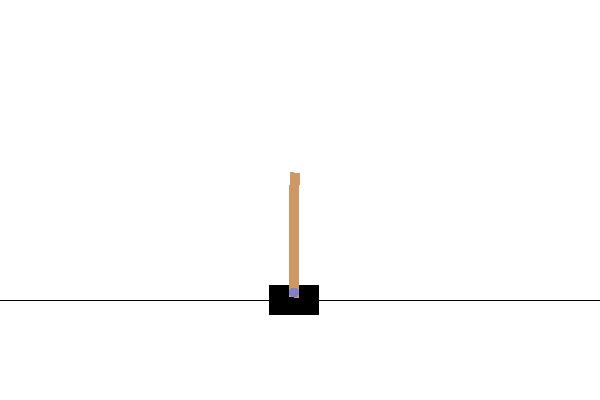

In [17]:
score_on_multiple_episodes(env, theta, num_episodes=10, render=True)
env.render_wrapper.make_gif("rl3_ex4")

### Display the evolution of the average reward w.r.t. PG iterations

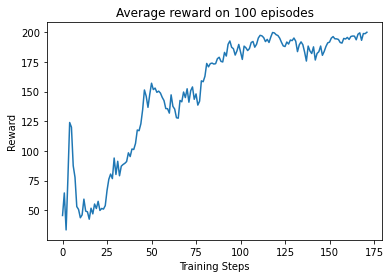

In [18]:
# Show training curve
plt.plot(range(len(average_returns)),average_returns)
plt.title("Average reward on 100 episodes")
plt.xlabel("Training Steps")
plt.ylabel("Reward")

plt.show()

env.close()

# Part 3: Implement DQN

In a previous lab, we have dealt with reinforcement learning in discrete state and action spaces. To do so, we used methods based on action-value function and, especially, Q-function estimation. The Q-function was stored in a table and updated with on- or off- policy algorithms (namely SARSA and Q-Learning).

Yet, these methods do not scale to large state spaces. The main idea behind Q-learning is that if we had a function
$Q^*: State \times Action \rightarrow \mathbb{R}$, that could tell us what our return would be, if we were to take an action in a given state, then we could easily construct a policy that maximizes our rewards:

\begin{align}\pi^*(s) = \arg\!\max_a \ Q^*(s, a)\end{align}

However, we don't know everything about the world, so we don't have access to $Q^*$. But, since neural networks are universal function approximators, we can simply create one and train it to resemble $Q^*$. To address this issue, an option is to make use of the power of deep learning to estimate the Q-value of a state-action pair even if it was never encountered before. A deep neural network is used to estimate the Q-value of each possible action in a given state. 

We recall the update rule for DQN:
$$Q(S_t,A_t)\gets Q(S_t,A_t)+\alpha\left[R_{t+1}+\gamma\max_aQ(S_{t+1},a)-Q(S_t,A_t)\right]$$


---
DQN Algorithm
---

Initialize $\mathcal{A}$ the agent neural network<br>
Copy $\mathcal{A}$ weights to initialize the target neural network $\mathcal{T}$<br>
Initialize batch_size B<br>
<b>FOR</b> i in nb_episodes:<br>
    $\quad$ <b>WHILE</b> not done:<br>
    $\quad$ $\quad$ Generate experience $exp\gets[\{s_1^1,a^1,r^1,s_2^1,done^1,\dots, s_1^n,a^n,r^n,s_2^n,done^n\}]$<br>
    $\quad$ $\quad$ <b>IF</b> len(exp)>B:<br>
        $\quad$ $\quad$ $\quad$ sample minibatch $\sim$ exp<br>
        $\quad$ $\quad$ $\quad$ $q_1 \gets \mathcal{A}(s_1)^B$<br>
        $\quad$ $\quad$ $\quad$ $q_2 \gets \mathcal{T}(s_2)^B$<br>
        $\quad$ $\quad$ $\quad$ q_target = reward_batch + $\gamma * q_2$ * (1-done_batch)<br>
        $\quad$ $\quad$ $\quad$ Update $\mathcal{A}$<br>
    $\quad$ $\quad$ Every j iterations, $\mathcal{A}$ = $\mathcal{T}$

## Exercise 5: Implement DQN

Fill the following cells to implement the DQN algorithm.

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from collections import deque
import copy
from tqdm.notebook import tqdm
import random

import gym

In [4]:
# Here we define some hyperparameters and the agent's architecture

env = gym.make('CartPole-v1', render_mode='rgb_array')
observation_space = env.observation_space.shape[0]
action_space = env.action_space.n

EPISODES = 150
LR = 0.0001
MEM_SIZE = 10000
BATCH_SIZE = 64
GAMMA = 0.95
EXPLORATION_MAX = 1.0
EXPLORATION_DECAY = 0.999
EXPLORATION_MIN = 0.001
sync_freq = 10

class Network(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.input_shape = env.observation_space.shape
        self.action_space = action_space

        self.fc1 = nn.Linear(*self.input_shape, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, self.action_space)

        self.optimizer = optim.Adam(self.parameters(), lr=LR)
        self.loss = nn.MSELoss()
        #self.to(DEVICE)
    
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)

        return x

In [22]:
class ReplayBuffer:
    def __init__(self):
        self.memory = deque(maxlen=MEM_SIZE)
    
    def add(self, experience):
        self.memory.append(experience)
    
    def sample(self):
        minibatch = random.sample(self.memory, BATCH_SIZE)

        state1_batch = torch.stack([s1 for (s1,a,r,s2,d) in minibatch])
        action_batch = torch.tensor([a for (s1,a,r,s2,d) in minibatch])
        reward_batch = torch.tensor([r for (s1,a,r,s2,d) in minibatch])
        state2_batch = torch.stack([s2 for (s1,a,r,s2,d) in minibatch])
        done_batch = torch.tensor([d for (s1,a,r,s2,d) in minibatch])

        return (state1_batch, action_batch, reward_batch, state2_batch, done_batch)

In [23]:
class DQN:
    def __init__(self):
        self.replay = ReplayBuffer()
        self.exploration_rate = EXPLORATION_MAX
        self.network = Network()
        self.network2 = copy.deepcopy(self.network) #A
        self.network2.load_state_dict(self.network.state_dict())


    def choose_action(self, observation):
        if random.random() < self.exploration_rate:
            return env.action_space.sample()

        # Convert observation to PyTorch Tensor
        state = torch.tensor(observation).float().detach()
        #state = state.to(DEVICE)
        state = state.unsqueeze(0)
            
        ### BEGIN SOLUTION ###

        # Get Q(s,.)
        q_values = self.network(state)

        # Choose the action to play
        action = torch.argmax(q_values).item()

        ### END SOLUTION ###

        return action


    def learn(self):
        if len(self.replay.memory)< BATCH_SIZE:
            return

        ### BEGIN SOLUTION ###

        # Sample minibatch s1, a1, r1, s1', done_1, ... , sn, an, rn, sn', done_n
        state1_batch, action_batch, reward_batch, state2_batch, done_batch = self.replay.sample()

        # Compute Q values
        q_values = self.network(state1_batch).squeeze()

        with torch.no_grad():
            # Compute next Q values
            next_q_values = self.network2(state2_batch).squeeze()

        batch_indices = np.arange(BATCH_SIZE, dtype=np.int64)

        predicted_value_of_now = q_values[batch_indices, action_batch]
        predicted_value_of_future = torch.max(next_q_values, dim=1)[0]

        # Compute the q_target
        q_target = reward_batch + GAMMA * predicted_value_of_future * (1-(done_batch).long())

        # Compute the loss (c.f. self.network.loss())
        loss = self.network.loss(q_target, predicted_value_of_now)

        ### END SOLUTION ###

        # Complute 𝛁Q
        self.network.optimizer.zero_grad()
        loss.backward()
        self.network.optimizer.step()

        self.exploration_rate *= EXPLORATION_DECAY
        self.exploration_rate = max(EXPLORATION_MIN, self.exploration_rate)


    def returning_epsilon(self):
        return self.exploration_rate

/home/jeremie/anaconda3/envs/psc/lib/python3.7/site-packages/ipykernel_launcher.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/jeremie/anaconda3/envs/psc/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


Episode 10 Average Reward 18.2 Best Reward 22.0 Last Reward 14.0 Epsilon 0.887754942528593
Episode 20 Average Reward 20.05 Best Reward 43.0 Last Reward 43.0 Epsilon 0.7130746876787832
Episode 30 Average Reward 43.8 Best Reward 200.0 Last Reward 200.0 Epsilon 0.28603934224861294
Episode 40 Average Reward 82.25 Best Reward 200.0 Last Reward 200.0 Epsilon 0.03961234065868409
Episode 50 Average Reward 104.72 Best Reward 200.0 Last Reward 163.0 Epsilon 0.005652890760569179
Episode 60 Average Reward 120.25 Best Reward 200.0 Last Reward 200.0 Epsilon 0.001
Episode 70 Average Reward 131.5857142857143 Best Reward 200.0 Last Reward 200.0 Epsilon 0.001
Episode 80 Average Reward 137.675 Best Reward 200.0 Last Reward 11.0 Epsilon 0.001
Episode 90 Average Reward 144.6 Best Reward 200.0 Last Reward 200.0 Epsilon 0.001
Episode 100 Average Reward 150.14 Best Reward 200.0 Last Reward 200.0 Epsilon 0.001
Episode 110 Average Reward 154.6727272727273 Best Reward 200.0 Last Reward 200.0 Epsilon 0.001
Episod

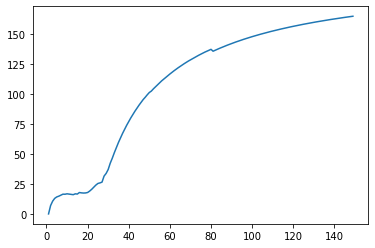

In [34]:
agent = DQN()

env = gym.make('CartPole-v1', render_mode='rgb_array')
best_reward = 0
average_reward = 0
episode_number = []
average_reward_number = []

j=0
for i in tqdm(range(1, EPISODES)):
    state, info = env.reset()
    state = np.reshape(state, [1, observation_space])
    score = 0

    while True:
        j+=1

        action = agent.choose_action(state)
        state_, reward, done, truncated, info = env.step(action)
        state_ = np.reshape(state_, [1, observation_space])
        state = torch.tensor(state).float()
        state_ = torch.tensor(state_).float()

        exp = (state, action, reward, state_, done)
        agent.replay.add(exp)
        agent.learn()

        state = state_
        score += reward

        if j % sync_freq == 0:
            agent.network2.load_state_dict(agent.network.state_dict())

        if done:
            if score > best_reward:
                best_reward = score
            average_reward += score 
            if i%10==0:
                print("Episode {} Average Reward {} Best Reward {} Last Reward {} Epsilon {}".format(i, average_reward/i, best_reward, score, agent.returning_epsilon()))
                #test_model(agent,10, observation_space)
            break
  
        episode_number.append(i)
        average_reward_number.append(average_reward/i)

plt.plot(episode_number, average_reward_number)
plt.show()

In [35]:
def test_model(model, num_episodes, observation_space):

    for i_episode in range(num_episodes):
        G=0
        observation, info = env.reset()
        done = False
        while not done:
            observation = torch.from_numpy(observation).float()
            observation = np.reshape(observation, [1, observation_space])
            action = model.choose_action(observation)
            observation, reward, done, truncated, info = env.step(action)
            G += reward
            if done:
                print(G)
                break

[[ 0.01226008 -0.03146339  0.00063608  0.03815584]]
[ 0.01163082  0.16364943  0.0013992  -0.25432633]
[ 0.0149038  -0.03149247 -0.00368733  0.0387976 ]
[ 0.01427396  0.16368216 -0.00291137 -0.25504643]
[ 0.0175476  -0.0313981  -0.0080123   0.03671678]
[ 0.01691964  0.16383783 -0.00727797 -0.2584833 ]
[ 0.02019639 -0.03117947 -0.01244763  0.03189519]
[ 0.0195728   0.16411875 -0.01180973 -0.26468896]
[ 0.02285518 -0.03083266 -0.01710351  0.02424579]
[ 0.02223853 -0.22570521 -0.01661859  0.31148368]
[ 0.01772442 -0.03035049 -0.01038892  0.01360642]
[ 0.01711741 -0.22532192 -0.01011679  0.30299349]
[ 0.01261097 -0.03005726 -0.00405692  0.0071372 ]
[ 0.01200983 -0.22512079 -0.00391418  0.29853737]
[ 0.00750741 -0.02994327  0.00205657  0.00462255]
[ 0.00690855  0.16514913  0.00214902 -0.28741079]
[ 0.01021153 -0.0300034  -0.00359919  0.00594914]
[ 0.00961146 -0.22507355 -0.00348021  0.29749431]
[ 0.00510999 -0.02990216  0.00246967  0.00371582]
[ 0.00451195  0.16518428  0.00254399 -0.28818687

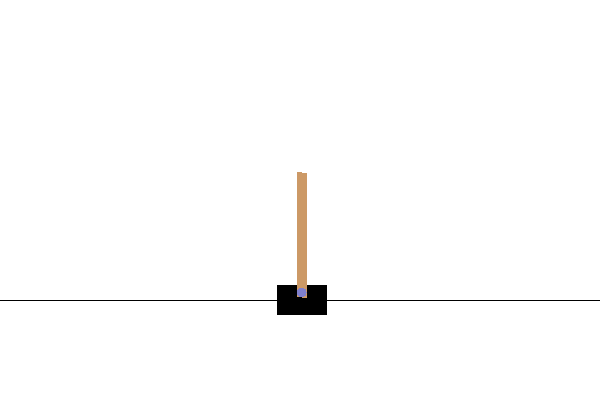

In [36]:
env = gym.make('CartPole-v1', render_mode='rgb_array')
RenderWrapper.register(env, force_gif=True)

observation, info = env.reset()
observation = np.reshape(observation, [1, observation_space])
done = False

for t in range(50):
    env.render_wrapper.render()

    if not done:
        print(observation)
    else:
        print("x", end="")

    action = agent.choose_action(observation)
    observation, reward, done, truncated, info = env.step(action)
    # TODO


print()
env.close()

env.render_wrapper.make_gif("rl3_ex1left")

In [ ]:
torch.save(agent.network.state_dict(), "rl3_dqn_cartpole.zip")